In [1]:
import warnings
from datetime import datetime, timedelta

import numpy as np
import pandas as pd

warnings.filterwarnings("ignore")

import acquire
import matplotlib.pyplot as plt
import prepare
import seaborn as sns
import statsmodels.api as sm
from acquire import get_germany_data, get_stores
from prepare import clean_germany, clean_store
from sklearn.model_selection import TimeSeriesSplit

%matplotlib inline

plt.rc("figure", figsize=(13, 7))
# plt.style.use('seaborn-whitegrid')
plt.rc("font", size=16)
plt.rc("figure", figsize=(13, 7))
plt.rc("font", size=16)
plt.style.use("fivethirtyeight")

_____ 


### GREAT FOR NOTES .... and upcoming personal project !!!! 

____

# Exercise

## Do your work for this exercise in a notebook named explore. Use the techniques in the lesson to explore the store item demand dataset and the opsd dataset.

## For the store item demand data, you will need to choose a method of aggregating such that each observation is a unique date. For both datasets you should choose a method of splitting your data and only explore the training split.

In [2]:
# acquire the store data
df = get_stores()

df.head(1)

Data is cached. Reading from csv files.
Items data acquired
Items data acquired
Sales data acquired
********************
Acquisition Complete


,level_0,index,item_brand,item_id,item_name,item_price,item_upc12,item_upc14,Unnamed: 0,item,sale_amount,sale_date,sale_id,store,store_address,store_city,store_id,store_state,store_zipcode
0,0,0.00,Riceland,1,Riceland American Jazmine Rice,0.84,35200264013,35200264013,0,1,13.00,"Tue, 01 Jan 2013 00:00:00 GMT",1,1,12125 Alamo Ranch Pkwy,San Antonio,1,TX,78253


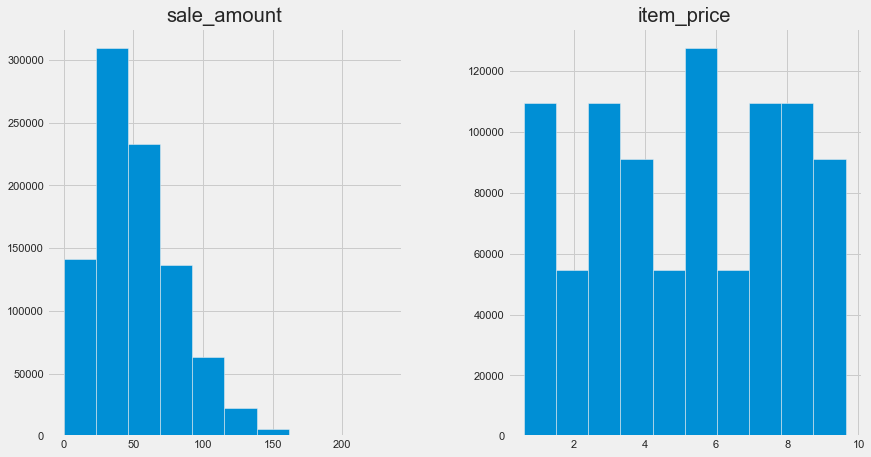

,store_id,item_id,sale_id,sale_amount,item_upc14,item_upc12,item_brand,item_name,item_price,store_address,store_zipcode,store_city,store_state,month,day_of_week,sales_total
sale_date,,,,,,,,,,,,,,,,
2013-01-01 00:00:00+00:00,1,1,1,13.00,35200264013,35200264013,Riceland,Riceland American Jazmine Rice,0.84,12125 Alamo Ranch Pkwy,78253,San Antonio,TX,1,Tuesday,10.92
2013-01-01 00:00:00+00:00,7,12,211817,26.00,74676640211,74676640211,Mueller,Mueller Sport Care Basic Support Level Medium ...,8.40,12018 Perrin Beitel Rd,78217,San Antonio,TX,1,Tuesday,218.40
2013-01-01 00:00:00+00:00,7,46,832657,27.00,35457770664,35457770664,Mama Marys,Pizza Sauce,4.65,12018 Perrin Beitel Rd,78217,San Antonio,TX,1,Tuesday,125.55
2013-01-01 00:00:00+00:00,8,12,213643,54.00,74676640211,74676640211,Mueller,Mueller Sport Care Basic Support Level Medium ...,8.40,15000 San Pedro Ave,78232,San Antonio,TX,1,Tuesday,453.60
2013-01-01 00:00:00+00:00,9,12,215469,35.00,74676640211,74676640211,Mueller,Mueller Sport Care Basic Support Level Medium ...,8.40,735 SW Military Dr,78221,San Antonio,TX,1,Tuesday,294.00


In [3]:
# prepare df
df = clean_store(df)
df.head()

In [4]:
import pandas_profiling  # The way that I perfer to so this

pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
print(
    "Date Range:", df.index.min(), "to", df.index.max()
)  # we are checking the data date range and the data shape to see what we are working with
print("Shape:", df.shape)

Date Range: 2013-01-01 00:00:00+00:00 to 2017-12-31 00:00:00+00:00
Shape: (913000, 16)


In [6]:
# split data (percentage-based)
# using 70/30 train test split %

train_size = 0.70
n = df.shape[0]
test_start_index = round(train_size * n)
test_start_index  # the first 639,100 rows will be set as train

639100

In [7]:
# create train and test dataframe

train = df[:test_start_index]  # everything up (not including) to the test_start_index
test = df[test_start_index:]  # everything from the test_start_index to the end

train.shape, test.shape

((639100, 16), (273900, 16))

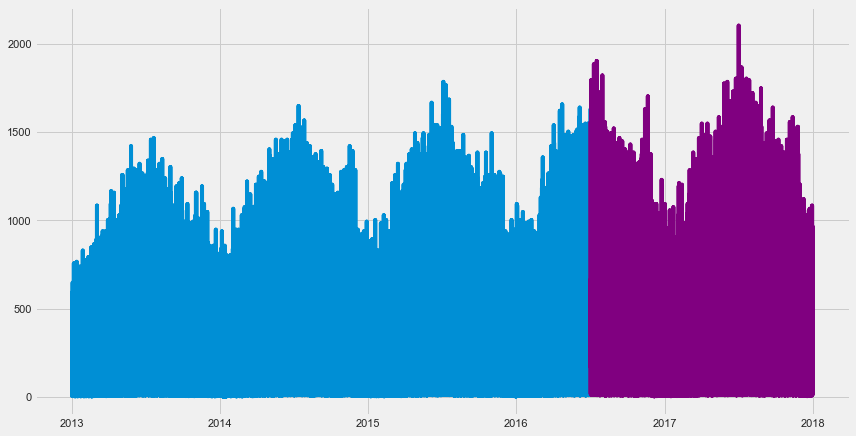

In [8]:
# plot train and test

plt.plot(
    train.index, train.sales_total
)  # For this we actuallly get to see what data and how the data is getting sliced and diced
plt.plot(test.index, test.sales_total, color="purple")

In [9]:
y = train.sales_total
y.head()  # Creation of a datafrom y =

sale_date
2013-01-01 00:00:00+00:00    10.92
2013-01-01 00:00:00+00:00   218.40
2013-01-01 00:00:00+00:00   125.55
2013-01-01 00:00:00+00:00   453.60
2013-01-01 00:00:00+00:00   294.00
Name: sales_total, dtype: float64

In [10]:
y.head()
y.info()

<class 'pandas.core.series.Series'>
DatetimeIndex: 639100 entries, 2013-01-01 00:00:00+00:00 to 2016-07-02 00:00:00+00:00
Series name: sales_total
Non-Null Count   Dtype  
--------------   -----  
639100 non-null  float64
dtypes: float64(1)
memory usage: 9.8 MB


<AxesSubplot:ylabel='Frequency'>

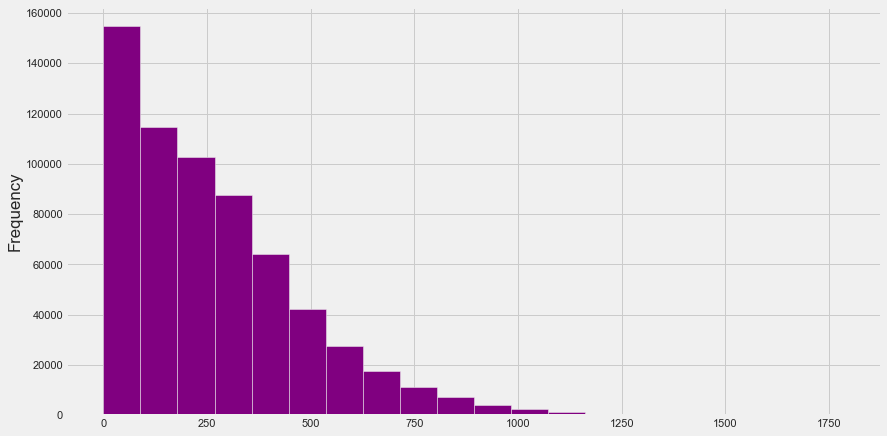

In [11]:
y.plot.hist(
    bins=20, color="purple"
)  # we will bin and look at the data with a histogram

In [12]:
# making a new col for 'year'
train["year"] = y.index.year
train.head()

,store_id,item_id,sale_id,sale_amount,item_upc14,item_upc12,item_brand,item_name,item_price,store_address,store_zipcode,store_city,store_state,month,day_of_week,sales_total,year
sale_date,,,,,,,,,,,,,,,,,
2013-01-01 00:00:00+00:00,1,1,1,13.00,35200264013,35200264013,Riceland,Riceland American Jazmine Rice,0.84,12125 Alamo Ranch Pkwy,78253,San Antonio,TX,1,Tuesday,10.92,2013
2013-01-01 00:00:00+00:00,7,12,211817,26.00,74676640211,74676640211,Mueller,Mueller Sport Care Basic Support Level Medium ...,8.40,12018 Perrin Beitel Rd,78217,San Antonio,TX,1,Tuesday,218.40,2013
2013-01-01 00:00:00+00:00,7,46,832657,27.00,35457770664,35457770664,Mama Marys,Pizza Sauce,4.65,12018 Perrin Beitel Rd,78217,San Antonio,TX,1,Tuesday,125.55,2013
2013-01-01 00:00:00+00:00,8,12,213643,54.00,74676640211,74676640211,Mueller,Mueller Sport Care Basic Support Level Medium ...,8.40,15000 San Pedro Ave,78232,San Antonio,TX,1,Tuesday,453.60,2013
2013-01-01 00:00:00+00:00,9,12,215469,35.00,74676640211,74676640211,Mueller,Mueller Sport Care Basic Support Level Medium ...,8.40,735 SW Military Dr,78221,San Antonio,TX,1,Tuesday,294.00,2013


In [13]:
train.groupby(
    "year"
).sales_total.mean()  # group by function so that we can smoosh these  togeather

year
2013   233.97
2014   269.11
2015   280.97
2016   291.63
Name: sales_total, dtype: float64

<AxesSubplot:xlabel='year'>

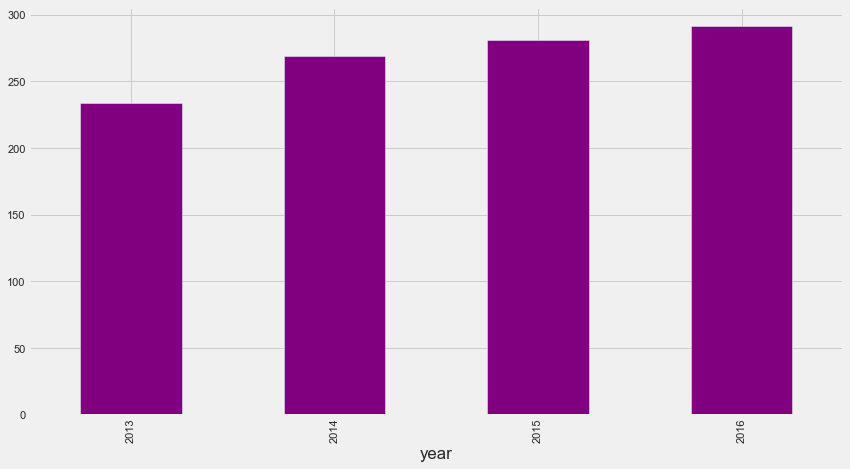

In [14]:
train.groupby("year").sales_total.mean().plot.bar(
    color="purple"
)  # once again taking a look at the years so we can get a better idea

<AxesSubplot:xlabel='day_of_week'>

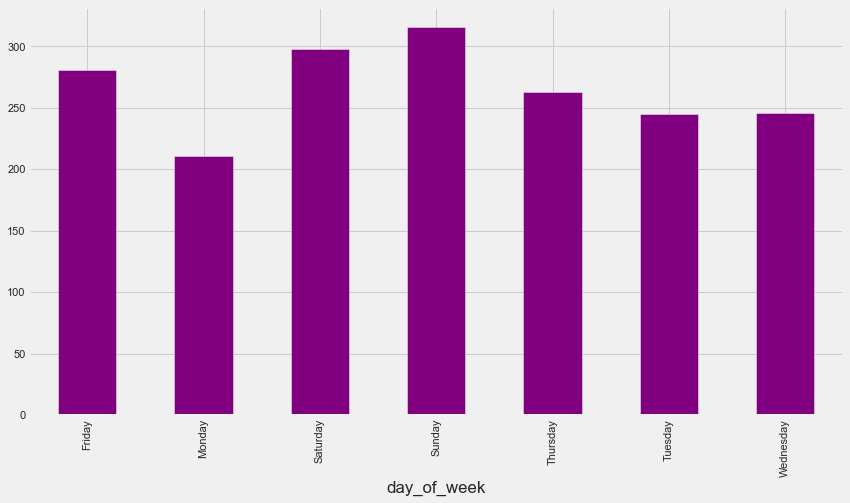

In [15]:
train.groupby("day_of_week").sales_total.mean().plot.bar(
    color="purple"
)  # Now we are going to look at the days of the week

<AxesSubplot:xlabel='day_of_week', ylabel='sales_total'>

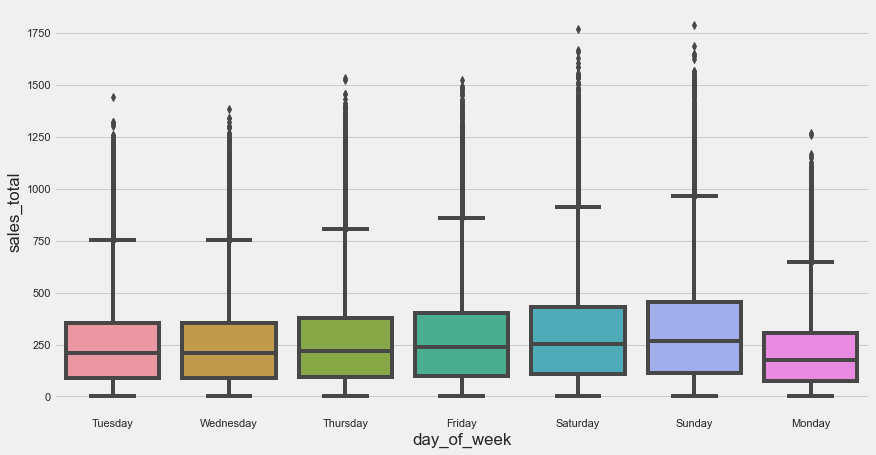

In [16]:
sns.boxplot(data=train, x="day_of_week", y="sales_total")  # Box Plots

In [17]:
y = train.resample("D").sales_total.mean()
y.head()

sale_date
2013-01-01 00:00:00+00:00   147.69
2013-01-02 00:00:00+00:00   147.14
2013-01-03 00:00:00+00:00   156.34
2013-01-04 00:00:00+00:00   168.94
2013-01-05 00:00:00+00:00   175.24
Freq: D, Name: sales_total, dtype: float64

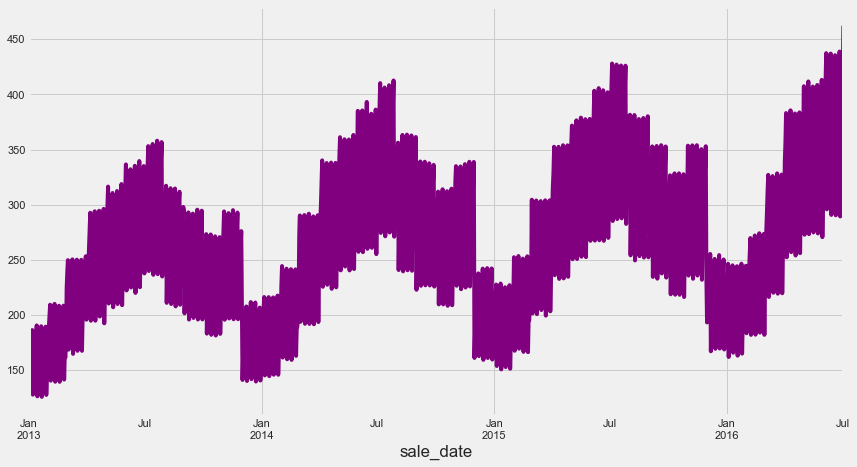

In [18]:
# Plots target variable over time
y.plot(color="purple")
plt.show()

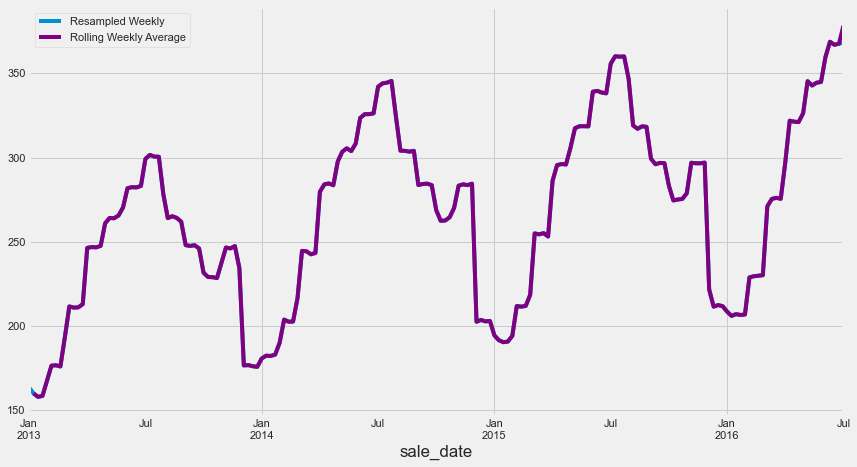

In [19]:
# Plot the weekly average & the 7-day moving average. Compare the 2 plots.

y.resample("W").mean().plot(label="Resampled Weekly")
y.rolling(7).mean().plot(label="Rolling Weekly Average", color="purple")
plt.legend()

Text(0, 0.5, 'Difference in sales from one day to the next')

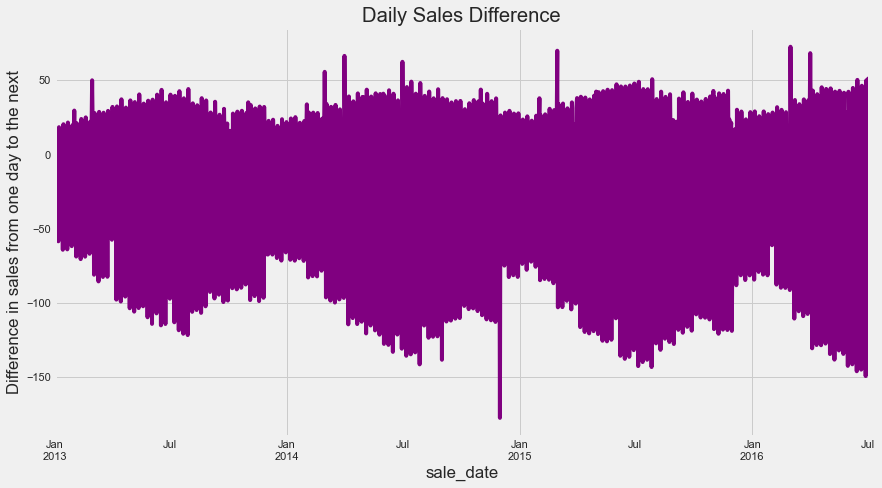

In [20]:
# Plot the daily difference.
# Observe whether usage seems to vary drastically from day to day or has more of a smooth transition.

y.diff().plot(color="purple")
plt.title("Daily Sales Difference")
plt.ylabel("Difference in sales from one day to the next")

Text(0, 0.5, '% Change')

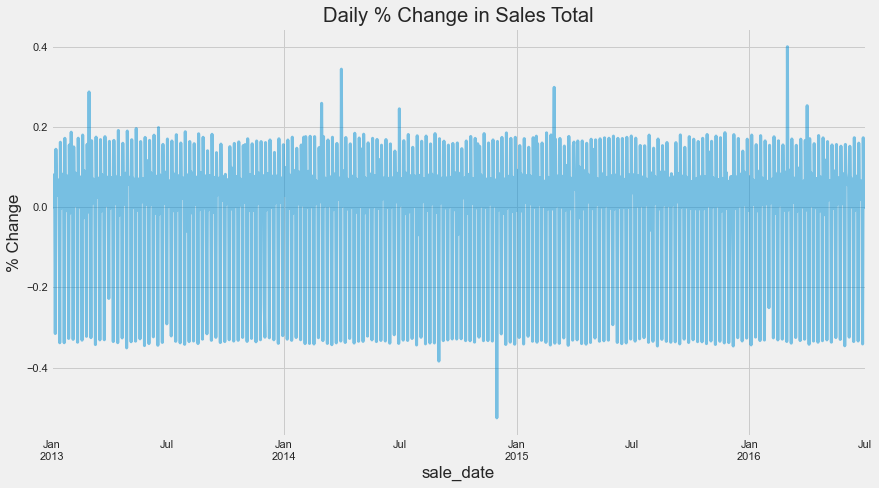

In [21]:
# Lets go ahead and check out the % of the data set

(y.diff() / y.shift()).plot(alpha=0.5, lw=3)
plt.title("Daily % Change in Sales Total")
plt.ylabel("% Change")

[Text(0.5, 1.0, 'Monthly % Change in Sales Total')]

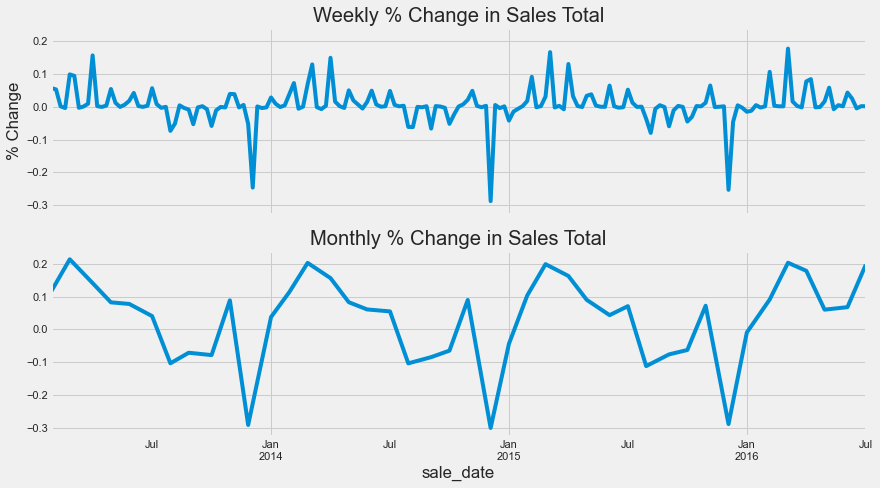

In [22]:
# take a look at this week over week and month over month as well
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True)

weekly = y.resample("W").mean()
(weekly.diff() / weekly.shift()).plot(ax=ax1)
ax1.set(title="Weekly % Change in Sales Total", ylabel="% Change", xlabel="")

monthly = y.resample("M").mean()
(monthly.diff() / monthly.shift()).plot(ax=ax2)
ax2.set(title="Monthly % Change in Sales Total")
# ax2.hlines(0, *ax2.get_xlim())

In [23]:
y.resample("W").mean()

sale_date
2013-01-06 00:00:00+00:00   163.59
2013-01-13 00:00:00+00:00   159.98
2013-01-20 00:00:00+00:00   157.95
2013-01-27 00:00:00+00:00   158.55
2013-02-03 00:00:00+00:00   167.59
                             ...  
2016-06-05 00:00:00+00:00   359.76
2016-06-12 00:00:00+00:00   368.76
2016-06-19 00:00:00+00:00   366.95
2016-06-26 00:00:00+00:00   367.59
2016-07-03 00:00:00+00:00   368.14
Freq: W-SUN, Name: sales_total, Length: 183, dtype: float64

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

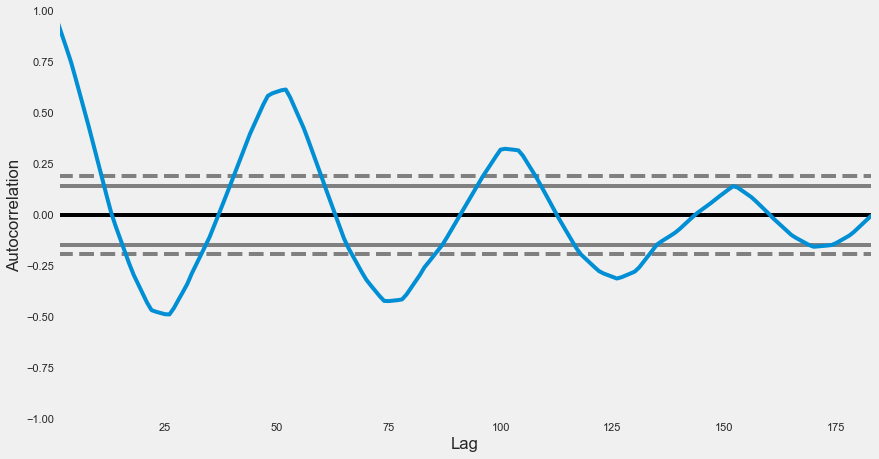

In [24]:
pd.plotting.autocorrelation_plot(y.resample("W").mean())

____


# Germany Data to Observe 



In [25]:
# acquire df
df = get_germany_data()
df.head()

,Date,Consumption,Wind,Solar,Wind+Solar
0,2006-01-01,1069.18,NaN,NaN,NaN
1,2006-01-02,1380.52,NaN,NaN,NaN
2,2006-01-03,1442.53,NaN,NaN,NaN
3,2006-01-04,1457.22,NaN,NaN,NaN
4,2006-01-05,1477.13,NaN,NaN,NaN


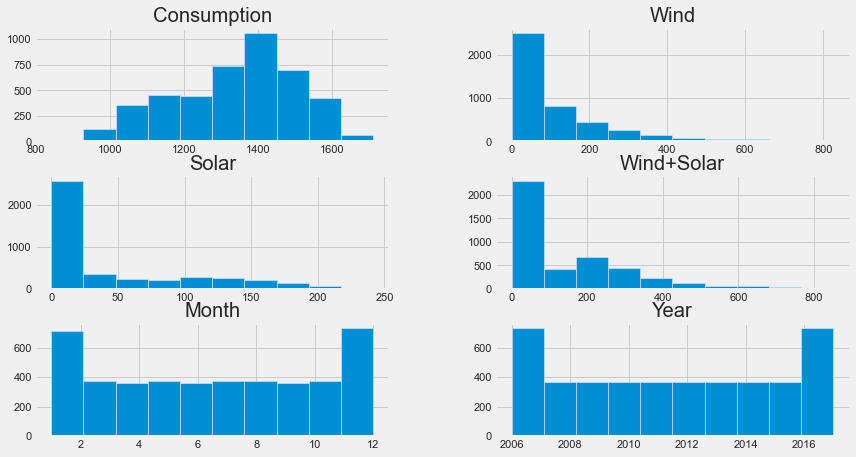

,Consumption,Wind,Solar,Wind+Solar,Month,Year
Date,,,,,,
2006-01-01,1069.18,0.00,0.00,0.00,1,2006
2006-01-02,1380.52,0.00,0.00,0.00,1,2006
2006-01-03,1442.53,0.00,0.00,0.00,1,2006
2006-01-04,1457.22,0.00,0.00,0.00,1,2006
2006-01-05,1477.13,0.00,0.00,0.00,1,2006


In [26]:
# prepared df
df = clean_germany(df)
df.head()

In [27]:
pandas_profiling.ProfileReport(
    df
)  # Once again this is a better way to do this with all the tests and such

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [28]:
train = df[:"2013"]
train.head()

,Consumption,Wind,Solar,Wind+Solar,Month,Year
Date,,,,,,
2006-01-01,1069.18,0.00,0.00,0.00,1,2006
2006-01-02,1380.52,0.00,0.00,0.00,1,2006
2006-01-03,1442.53,0.00,0.00,0.00,1,2006
2006-01-04,1457.22,0.00,0.00,0.00,1,2006
2006-01-05,1477.13,0.00,0.00,0.00,1,2006


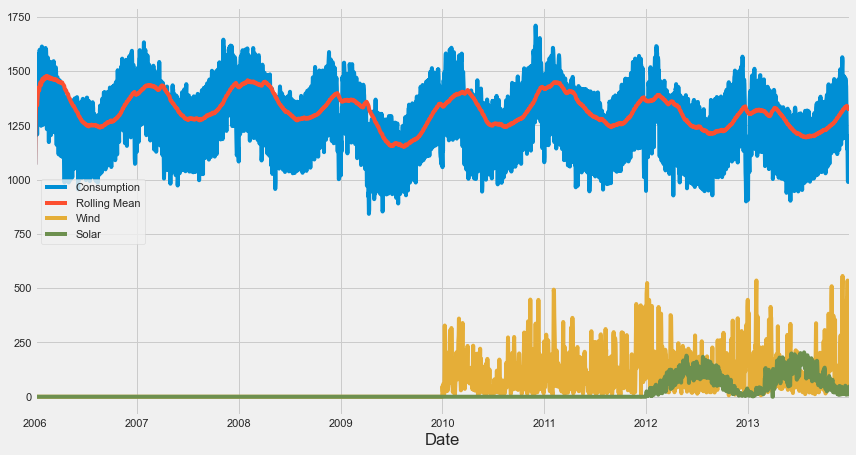

In [29]:
# plot the consumption, wind and solar data

train.Consumption.plot(label="Consumption")
plt.plot(train["Consumption"].rolling("90D").mean(), label="Rolling Mean")
train.Wind.plot()
train.Solar.plot()
plt.legend()

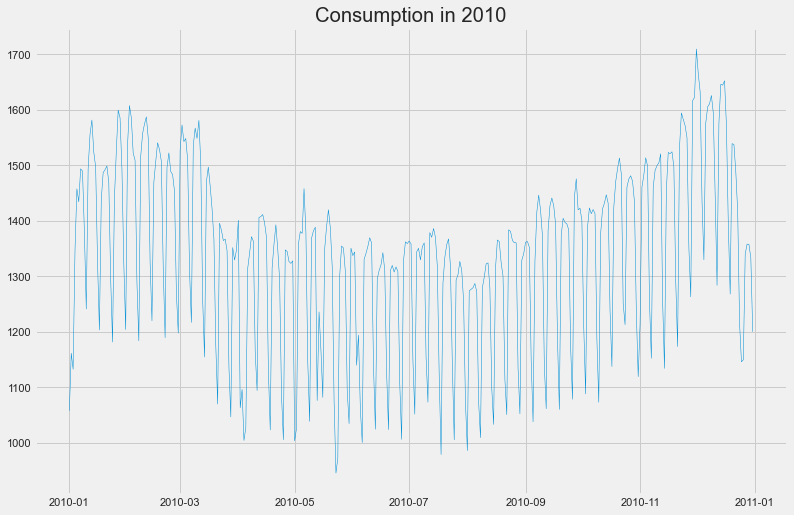

In [30]:
# Now we will look at the consumption
plt.figure(figsize=(12, 8))
plt.plot(train.loc["2010-01":"2010-12"]["Consumption"], linewidth=0.5)
plt.title("Consumption in 2010")
plt.show()

<AxesSubplot:xlabel='Date'>

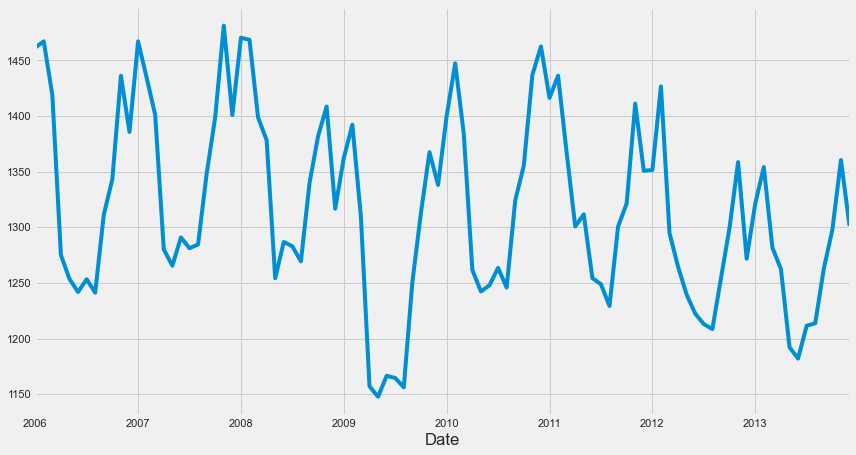

In [31]:
# resample monthly plot

train.Consumption.resample("M").mean().plot()

<AxesSubplot:xlabel='Date'>

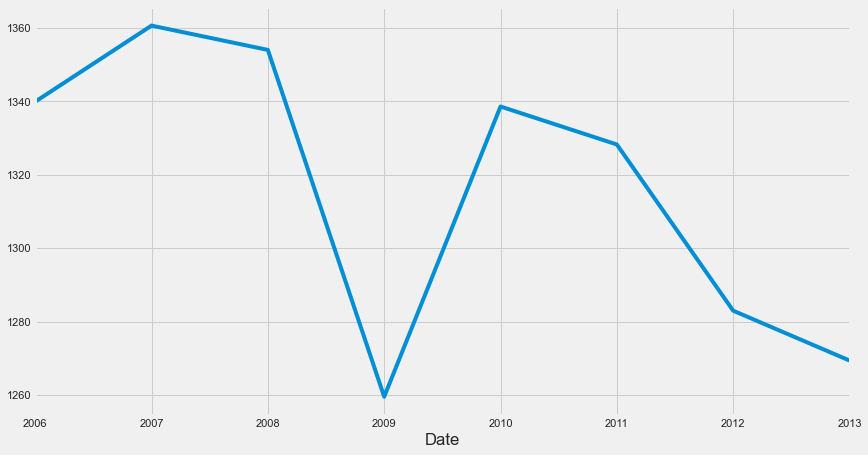

In [32]:
train.Consumption.resample("Y").mean().plot()

<AxesSubplot:xlabel='Date'>

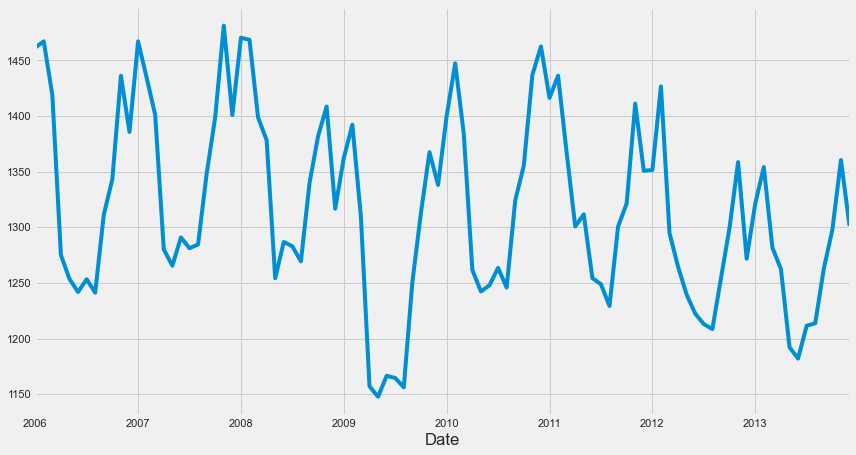

In [33]:
train.Consumption.resample("M").mean().plot()

In [34]:
train.isnull().sum()

Consumption    0
Wind           0
Solar          0
Wind+Solar     0
Month          0
Year           0
dtype: int64

In [35]:
# filling all NaNs with zero
train = train.fillna(0)

In [36]:
# make a new datafrsame sources, We also do this so that we can get a better look at the sources in data and organize it in our analysis
sources = train[["Consumption", "Wind", "Solar"]]

# make a new column called conventional: Consumption - Wind - Solar
sources["Conventional"] = sources.Consumption - sources.Wind - sources.Solar

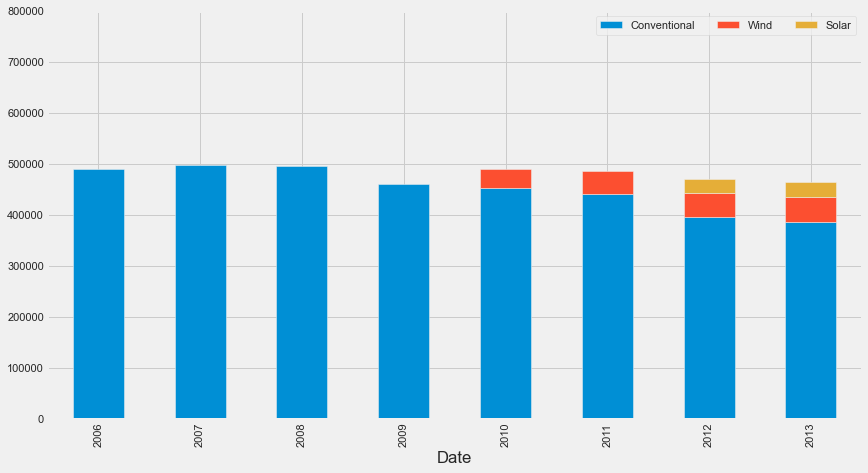

In [37]:
ax = (
    sources[["Conventional", "Wind", "Solar"]]
    .resample("Y")
    .sum()
    .plot.bar(stacked=True)
)
ax.legend(ncol=3)
ax.set_ylim(0, 800000)

labels = [pd.to_datetime(t.get_text()).strftime("%Y") for t in ax.get_xticklabels()]
ax.set_xticklabels(labels);

<AxesSubplot:xlabel='Date'>

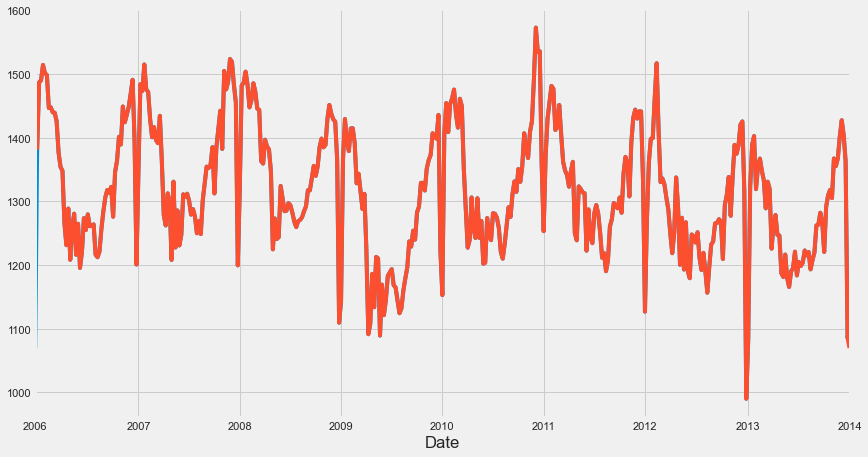

In [38]:
# plot the weekly average and the 7-day moving average and compare the 2 plots
train.Consumption.resample("W").mean().plot()
train.Consumption.rolling(7).mean().plot()

<AxesSubplot:xlabel='Date'>

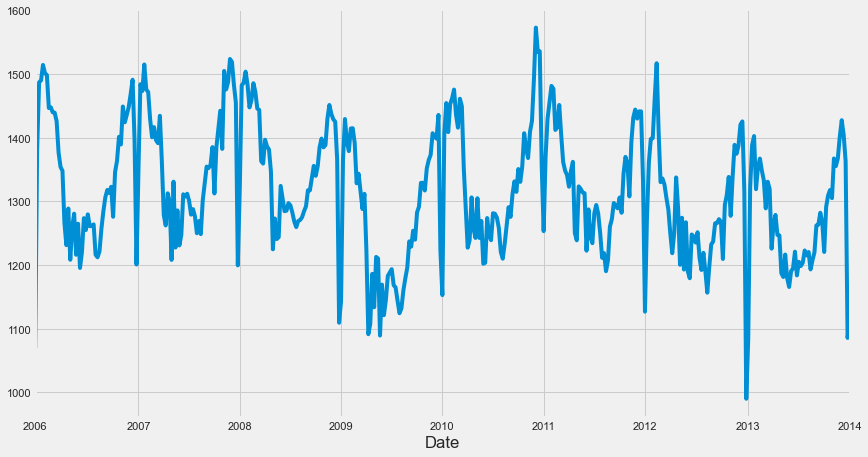

In [39]:
train.Consumption.resample("W").mean().plot()  # they just overlap

<AxesSubplot:xlabel='Month', ylabel='Consumption'>

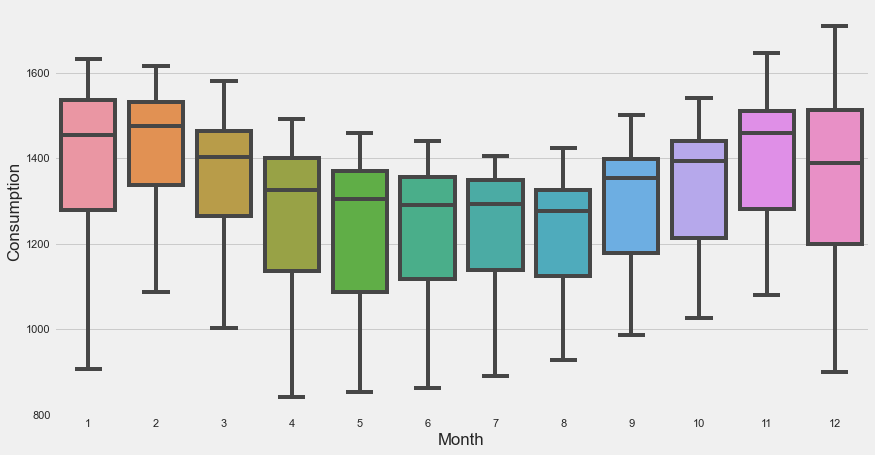

In [40]:
# group the electricity consumption time sereies by month of year, to explore annual seasonality
train["Month"] = train.index.month
train["Weekday"] = train.index.day_name()
sns.boxplot(
    data=train, x="Month", y="Consumption"
)  # This shows the amount of energy consumption in a month

<AxesSubplot:xlabel='Weekday', ylabel='Consumption'>

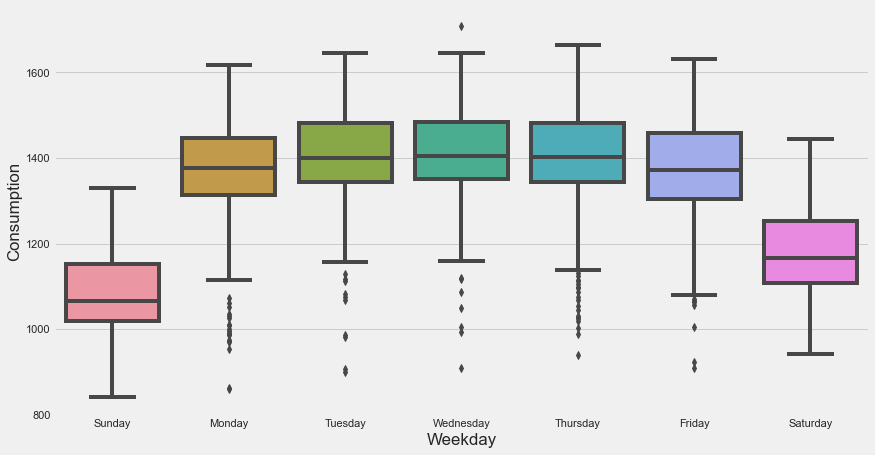

In [41]:
sns.boxplot(
    data=train, x="Weekday", y="Consumption"
)  # this now shows it by the weekday

In [42]:
y = train.Consumption
table = y.groupby([y.index.strftime("%Y"), y.index.strftime("%m-%b")]).mean().unstack(0)

table.head()  # this is an importent operation, becuase it allows us to modify or minupulate our data so some of our plotting graphs can make it better

Date,2006,2007,2008,2009,2010,2011,2012,2013
Date,,,,,,,,
01-Jan,1461.44,1467.06,1470.37,1362.26,1400.04,1416.29,1351.44,1321.19
02-Feb,1467.11,1434.48,1468.49,1392.16,1447.32,1436.21,1426.67,1354.09
03-Mar,1418.65,1400.91,1398.65,1309.22,1383.87,1366.99,1294.75,1281.67
04-Apr,1275.06,1280.13,1378.24,1157.01,1261.51,1300.73,1264.43,1262.36
05-May,1253.49,1265.44,1254.19,1147.65,1242.22,1311.61,1239.39,1192.12


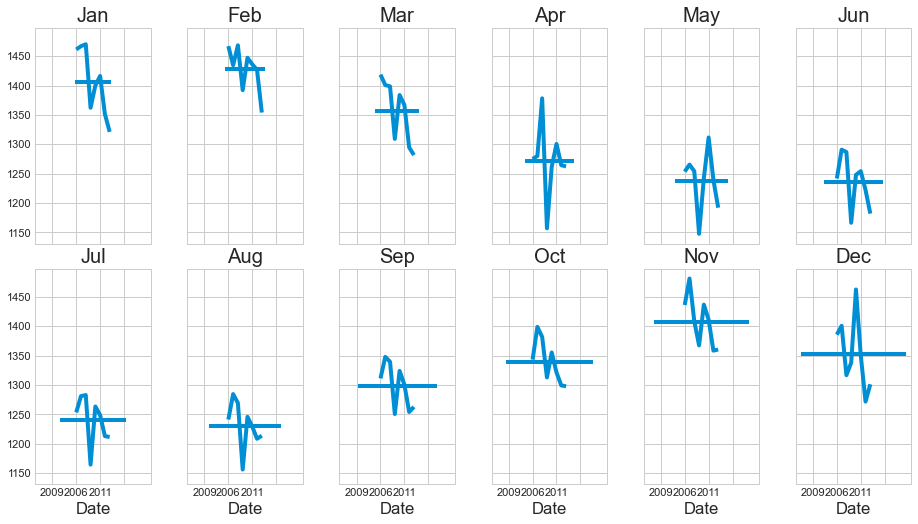

In [43]:
# making a subseasonal plot
with plt.style.context(
    "seaborn-whitegrid"
):  # This seems like a more orginized way to look at this information
    fig, axs = plt.subplots(2, 6, sharex=True, sharey=True)

fig.subplots_adjust(wspace=0)
fig.tight_layout()
for ax, (month, x) in zip(axs.ravel(), table.T.iteritems()):
    x.plot(ax=ax, title=month[3:])
    ax.hlines(x.mean(), *ax.get_xlim())

[Text(0.5, 1.0, 'Wind production pattern')]

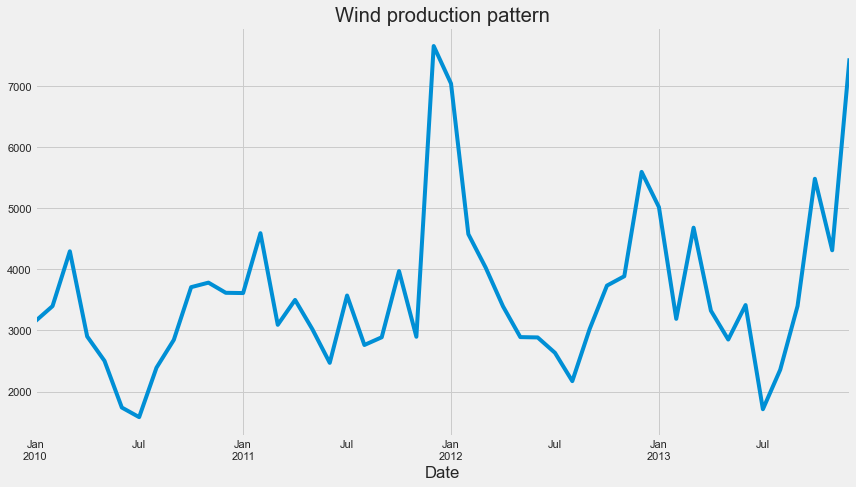

In [44]:
ax = train["2010":].Wind.resample("M").sum().plot()
ax.set(
    title="Wind production pattern"
)  # we taking a look at the wind production patterns for jan and july

[Text(0.5, 1.0, 'Solar production pattern')]

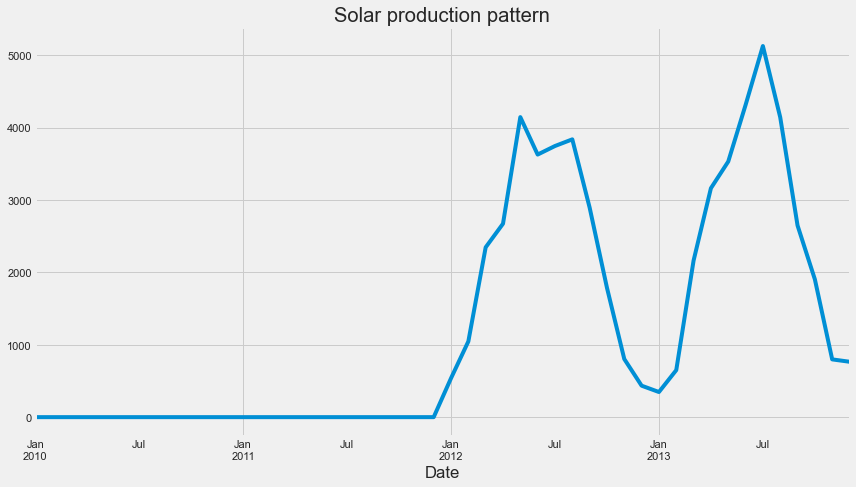

In [45]:
# How does the solar production/consumption vary within a year and also year to year?

ax = train["2010":].Solar.resample("M").sum().plot()
ax.set(
    title="Solar production pattern"
)  # we can also see a divant when solar production pattern drops !!!

In [49]:
# bring in the GDP growth rate data

growth_rate = {
    2006: 3.815,
    2007: 2.984,
    2008: 0.962,
    2009: -5.697,
    2010: 4.179,
    2011: 3.924,
    2012: 0.42,
    2013: 0.428,
    2014: 2.226,
    2015: 1.74,
    2016: 2.23,
    2017: 2.465,
}
growth_rate = pd.DataFrame.from_dict(
    growth_rate, orient="index", columns=["growth_rate"]
)
growth_rate.index = pd.to_datetime(growth_rate.index, format="%Y")
growth_rate.head()

,growth_rate
2006-01-01,3.81
2007-01-01,2.98
2008-01-01,0.96
2009-01-01,-5.70
2010-01-01,4.18


Text(0, 0.5, 'Growth Rate')

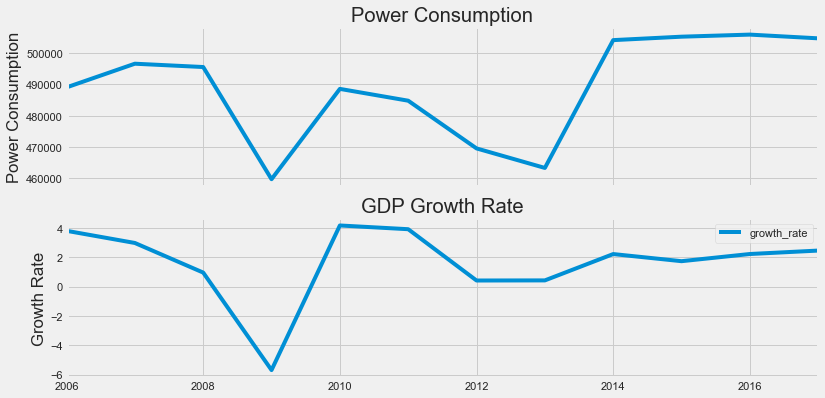

In [54]:
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(16, 9))

ax = df.Consumption.resample("Y").sum().plot(figsize=(12, 6), ax=ax1)
ax1.set(title="Power Consumption")
ax1.set_ylabel("Power Consumption")

growth_rate.plot(ax=ax2)
ax2.set(title="GDP Growth Rate")
ax2.set_ylabel("Growth Rate")

In [55]:
decomposition = sm.tsa.seasonal_decompose(
    train.resample("W").Consumption.mean(), model="additive"
)

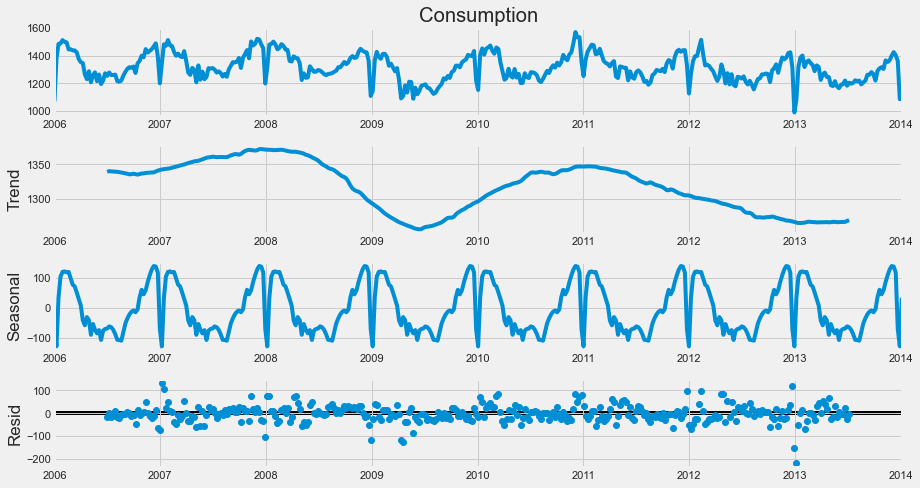

In [60]:
decomposition.plot()  # Trend, Seasonal and Residual plots
None

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

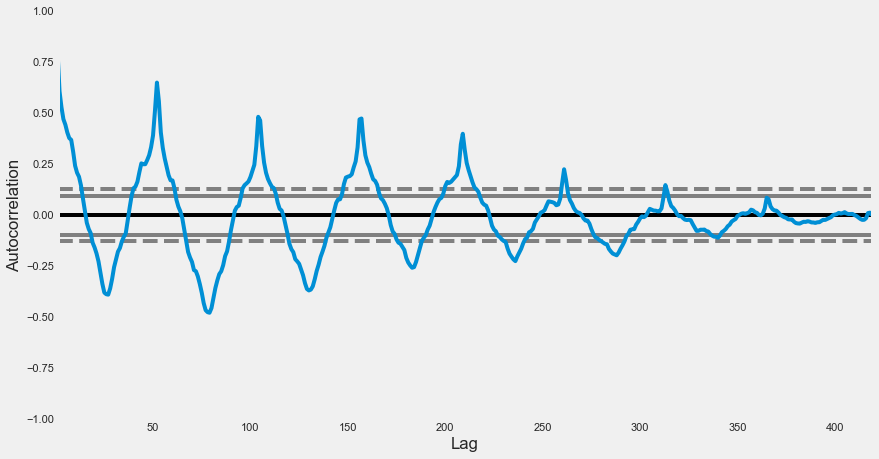

In [62]:
# autocorrelation plot
pd.plotting.autocorrelation_plot(
    train.Consumption.resample("W").mean()
)  # Correlation is a kind of osaltation until stagnant or flat

___ 


### GREAT FOR NOTES .... 